In [1]:
import torch
import sys
import scanpy as sc
import os
sys.path.append(os.path.abspath("FRLC"))
import FRLC
import FRLC_multimarginal
import importlib
import HiddenMarkovOT
import util_LR
from util_LR import convert_adata

#idxs = [1, 2, 3, 4]
idxs = [1]

In [2]:
"""
Timepoints, indexed by AnnData index
"""

timepoints_across_datasets =  [['E8.5', 'E8.75', 'E9.0']]

"""
For simplicity, we choose the first replicate for each timepoint as our dataset.
"""
replicates_across_datasets = [['embryo_11', 'embryo_14', 'embryo_16']]


In [3]:
import pandas as pd
import objective_grad
import clustering
import HiddenMarkovOT
import plotting
import pickle
import numpy as np


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Filehandle for final differentiation map outputs
diffmap_dir = "/scratch/gpfs/ph3641/hm_ot/ME_unsupervised_diffmap/"
os.makedirs(diffmap_dir, exist_ok=True)

# Cell-type labels for all timepoints + replicates
df_cell = pd.read_csv("/scratch/gpfs/ph3641/hm_ot/df_cell.csv")
df_cell = df_cell.set_index("cell_id")


In [4]:
importlib.reload(util_LR)
importlib.reload(HiddenMarkovOT)
importlib.reload(FRLC)


"""
Loading file / AnnData
"""
filehandle_ME = f'/scratch/gpfs/ph3641/hm_ot/adata_JAX_dataset_1.h5ad'
sys.path.insert(0, filehandle_ME)
adata = sc.read_h5ad(filehandle_ME, backed="r")

timepoints = ['E8.5', 'E8.75', 'E9.0']
t1, t2, t3 = timepoints
#replicates = replicates_across_datasets[i]

# Generate a subset of the dataset
subset_adata = adata[
        (adata.obs['day'].isin(timepoints))
]

"""
Now, (1) integrate cell-type labels and (2) perform HM-OT on the one-hot encoded labels.
"""
subset_adata = subset_adata.to_memory()

subset_adata.obs = subset_adata.obs.set_index("cell_id")
subset_adata.obs = subset_adata.obs.join(df_cell[['celltype_update']], how="left")

print(subset_adata[subset_adata.obs['day'] == t1])
print(subset_adata[subset_adata.obs['day'] == t2])
print(subset_adata[subset_adata.obs['day'] == t3])

'''
n_top_genes = 10000 
n_comps_pca = 50
min_genes_per_cell = 100  
max_genes_per_cell = 10000
sc.pp.filter_cells(subset_adata, min_genes=min_genes_per_cell)
sc.pp.filter_cells(subset_adata, max_genes=max_genes_per_cell)
sc.pp.normalize_total(subset_adata)
sc.pp.log1p(subset_adata)
sc.pp.highly_variable_genes(subset_adata, n_top_genes=n_top_genes, flavor='seurat_v3')
sc.pp.pca(subset_adata, n_comps=50)'''

print('-----Starting PCA!-----')
sc.pp.normalize_total(subset_adata, target_sum=1e4)
sc.pp.log1p(subset_adata)
sc.pp.pca(subset_adata, n_comps=30)
print('-----PCA done!-----')


""" Compute ranks """
rank1 = subset_adata[subset_adata.obs['day'] == t1].obs['celltype_update'].nunique()
rank2 = subset_adata[subset_adata.obs['day'] == t2].obs['celltype_update'].nunique()
rank3 = subset_adata[subset_adata.obs['day'] == t3].obs['celltype_update'].nunique()
print(f'Rank 1:{rank1}, Rank 2:{rank2}, Rank 3: {rank3}')

"""
Set distance matrix rank; if number of cell-types less than 100 then set to 100,
    otherwise default to smallest number of cell-types
"""
r_max = max(min(rank1,rank2,rank3),
            100)

C_factors_sequence, A_factors_sequence, Qs, labels, rank_list, _spatial_list = convert_adata(subset_adata,
                                                                      timepoints=timepoints,
                                                                        timepoint_key = 'day', 
                                                                          replicate_key = 'embryo_id',
                                                                          feature_key = 'X_pca',
                                                                            cell_type_key = 'celltype_update',
                                                                            spatial = False,
                                                                            dist_eps = 0.03,
                                                                            dist_rank = r_max, 
                                                                            device = device)

proportions = [torch.sum(torch.tensor(Qs[i]).to(torch.float32), axis=0) for i in range(len(Qs))]



'''
# Save Q matrices and T matrices as before
np.save(os.path.join(diffmap_dir, t1 + "_Q.npy"), Qs_ann[0])
np.save(os.path.join(diffmap_dir, t2 + "_Q.npy"), Qs_ann[1])
np.save(os.path.join(diffmap_dir, t1 + "_" + t2 + "_T.npy"), Ts_ann[0])

# Save the cell-type labels for each timepoint using write binary mode
with open(os.path.join(diffmap_dir, t1 + '_types.pkl'), 'wb') as f:
    pickle.dump(labels[0], f)

with open(os.path.join(diffmap_dir, t2 + '_types.pkl'), 'wb') as f:
    pickle.dump(labels[1], f)
'''

View of AnnData object with n_obs × n_vars = 153597 × 24552
    obs: 'keep', 'day', 'embryo_id', 'experimental_batch', 'celltype_update'
    var: 'gene_id', 'gene_type', 'gene_short_name', 'chr'
View of AnnData object with n_obs × n_vars = 46253 × 24552
    obs: 'keep', 'day', 'embryo_id', 'experimental_batch', 'celltype_update'
    var: 'gene_id', 'gene_type', 'gene_short_name', 'chr'
View of AnnData object with n_obs × n_vars = 118049 × 24552
    obs: 'keep', 'day', 'embryo_id', 'experimental_batch', 'celltype_update'
    var: 'gene_id', 'gene_type', 'gene_short_name', 'chr'
-----Starting PCA!-----
-----PCA done!-----
Rank 1:54, Rank 2:58, Rank 3: 65
Computing low-rank distance matrix!
Computing low-rank distance matrix!


/tmp/ipykernel_3178399/1970860993.py:76: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  proportions = [torch.sum(torch.tensor(Qs[i]).to(torch.float32), axis=0) for i in range(len(Qs))]


'\n# Save Q matrices and T matrices as before\nnp.save(os.path.join(diffmap_dir, t1 + "_Q.npy"), Qs_ann[0])\nnp.save(os.path.join(diffmap_dir, t2 + "_Q.npy"), Qs_ann[1])\nnp.save(os.path.join(diffmap_dir, t1 + "_" + t2 + "_T.npy"), Ts_ann[0])\n\n# Save the cell-type labels for each timepoint using write binary mode\nwith open(os.path.join(diffmap_dir, t1 + \'_types.pkl\'), \'wb\') as f:\n    pickle.dump(labels[0], f)\n\nwith open(os.path.join(diffmap_dir, t2 + \'_types.pkl\'), \'wb\') as f:\n    pickle.dump(labels[1], f)\n'

/tmp/ipykernel_3178399/2069264538.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Q_IC = torch.tensor(Qs[0]).to(torch.float32),
/tmp/ipykernel_3178399/2069264538.py:24: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  R_TC = torch.tensor(Qs[-1]).to(torch.float32))


Iteration: 0
Initial Wasserstein cost: 1.7500483701082814e-11, GW-cost: 0, Total cost: 1.7500483701082814e-11
Final Wasserstein cost: 1.5372913012012823e-11, GW-cost: 0, Total cost: 1.5372913012012823e-11


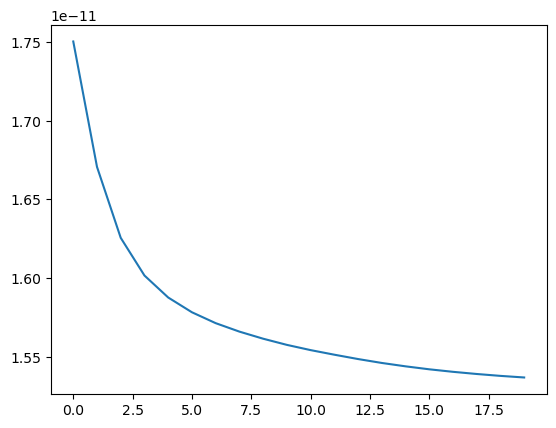

Iteration: 0
Initial Wasserstein cost: 2.4773929435673026e-11, GW-cost: 0, Total cost: 2.4773929435673026e-11
Final Wasserstein cost: 2.139515127563829e-11, GW-cost: 0, Total cost: 2.139515127563829e-11


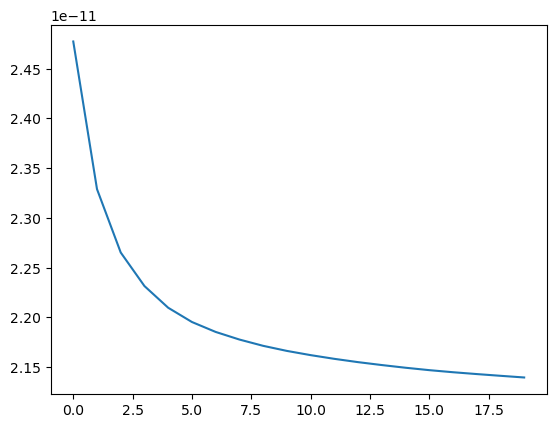

Iteration: 0
Initial Wasserstein cost: 1.7946682334679664e-11, GW-cost: 0, Total cost: 1.7946682334679664e-11
Final Wasserstein cost: 1.502228723360144e-11, GW-cost: 0, Total cost: 1.502228723360144e-11


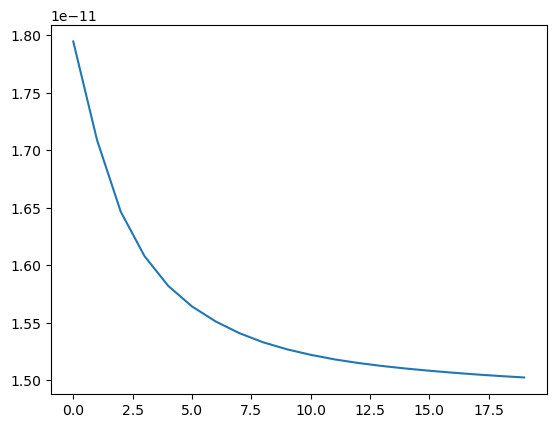

Ranks: r1 54, r2 58, r3 65
Iteration: 0
Initial Wasserstein-sum cost: 4.281963672525535e-11
Final Wasserstein-sum cost: 3.7145713588371265e-11


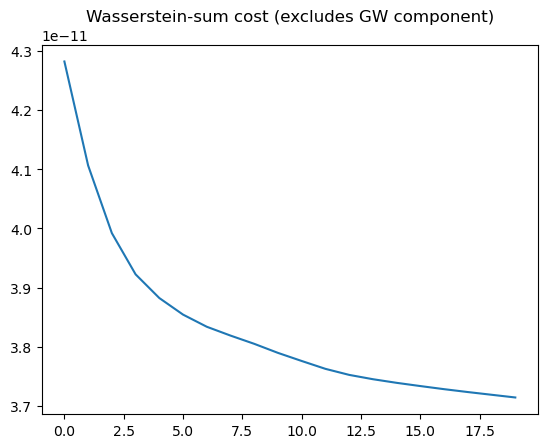

Iteration: 0
Initial Wasserstein cost: 1.7890619541383046e-11, GW-cost: 0, Total cost: 1.7890619541383046e-11
Final Wasserstein cost: 1.562026549772888e-11, GW-cost: 0, Total cost: 1.562026549772888e-11


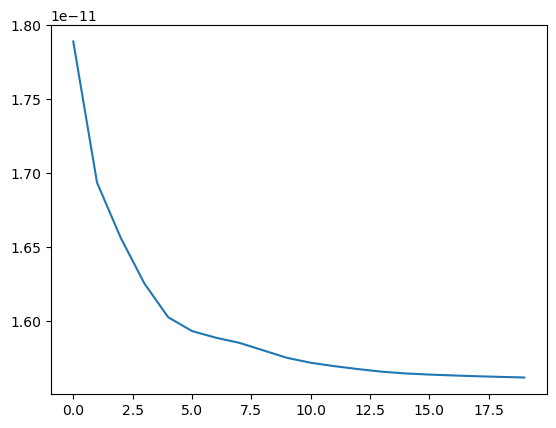

Iteration: 0
Initial Wasserstein cost: 2.530503931397199e-11, GW-cost: 0, Total cost: 2.530503931397199e-11
Final Wasserstein cost: 2.1594687843462523e-11, GW-cost: 0, Total cost: 2.1594687843462523e-11


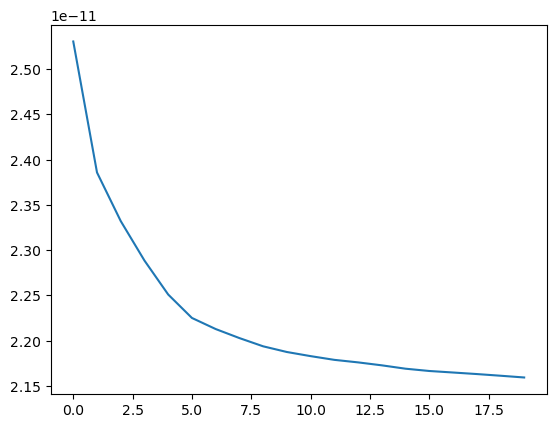

In [5]:
importlib.reload(HiddenMarkovOT)
importlib.reload(FRLC.FRLC_multimarginal)
import HiddenMarkovOT
from FRLC.FRLC_multimarginal import FRLC_LR_opt_multimarginal

hmot = HiddenMarkovOT.HM_OT(rank_list, 
                            tau_in = 1000,
                            gamma=30,
                            max_iter=20,
                            min_iter=20,
                            device=device,
                            dtype=torch.float32,
                             printCost=True,
                            returnFull=False,
                            alpha=0.0,
                            initialization='Full'
                           )
# ,proportions = proportions

#hmot.impute_annotated_transitions(C_factors_sequence, A_factors_sequence, Qs)
hmot.gamma_smoothing(C_factors_sequence,
                     A_factors_sequence,
                    Q_IC = torch.tensor(Qs[0]).to(torch.float32),
                    R_TC = torch.tensor(Qs[-1]).to(torch.float32))

(153597, 54)
(46253, 58)
(118049, 65)
(54, 58)
(58, 65)
54
58
65


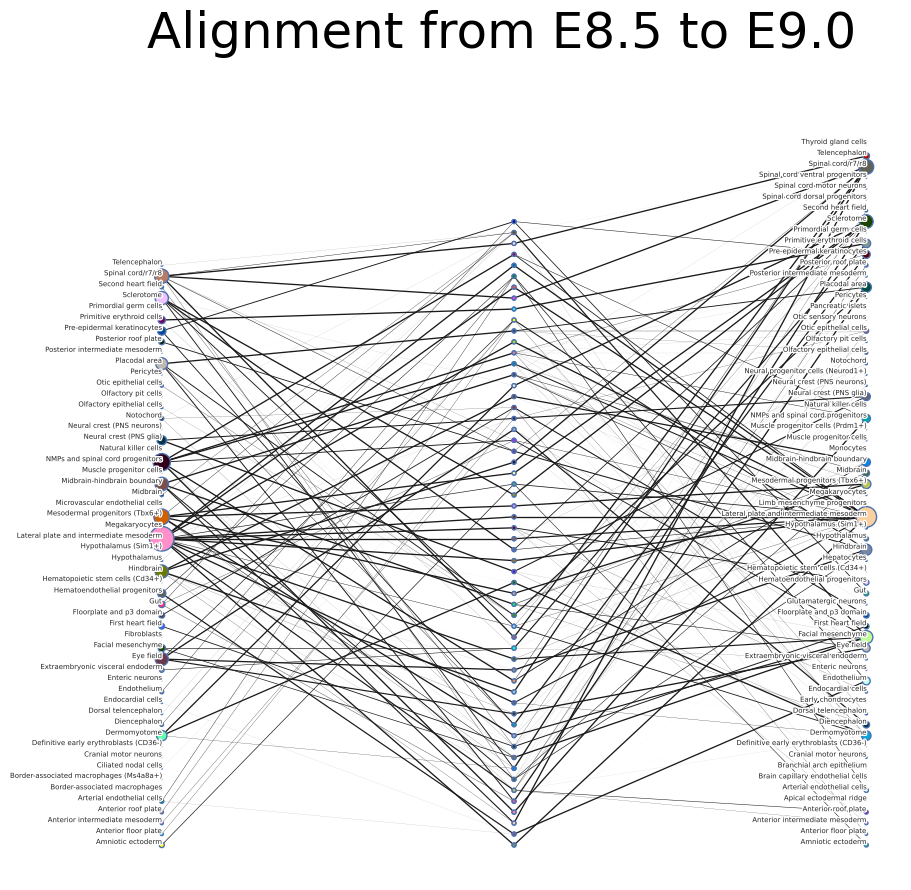

In [6]:
import plotting
importlib.reload(plotting)

Ts_ann = [T.cpu().numpy() for T in hmot.T_gammas]
Qs_ann = [Q.cpu().numpy() for Q in hmot.Q_gammas]

for Q in Qs_ann:
    print(Q.shape)

for T in Ts_ann:
    print(T.shape)

for lab in labels:
    print(len(lab))

plotting.diffmap_from_QT(Qs_ann,
                         Ts_ann,
                         [labels[0], None, labels[2]],
                         dsf=0.01,
                        fontsize=5,
                        linethick_factor=55,
                        title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
                        save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all.png") )

# dsf=0.01, fontsize=6, linethick_factor=20)

Mapping Amniotic ectoderm to self at times E8.5 to E9.0
Mapping Anterior floor plate to self at times E8.5 to E9.0
Mapping Anterior intermediate mesoderm to self at times E8.5 to E9.0
Mapping Anterior roof plate to self at times E8.5 to E9.0
Mapping Arterial endothelial cells to self at times E8.5 to E9.0
Mapping Cranial motor neurons to self at times E8.5 to E9.0
Mapping Definitive early erythroblasts (CD36-) to self at times E8.5 to E9.0
Mapping Dermomyotome to self at times E8.5 to E9.0
Mapping Diencephalon to self at times E8.5 to E9.0
Mapping Dorsal telencephalon to self at times E8.5 to E9.0
Mapping Endocardial cells to self at times E8.5 to E9.0
Mapping Endothelium to self at times E8.5 to E9.0
Mapping Enteric neurons to self at times E8.5 to E9.0
Mapping Extraembryonic visceral endoderm to self at times E8.5 to E9.0
Mapping Eye field to self at times E8.5 to E9.0
Mapping Facial mesenchyme to self at times E8.5 to E9.0
Mapping First heart field to self at times E8.5 to E9.0
Mapp

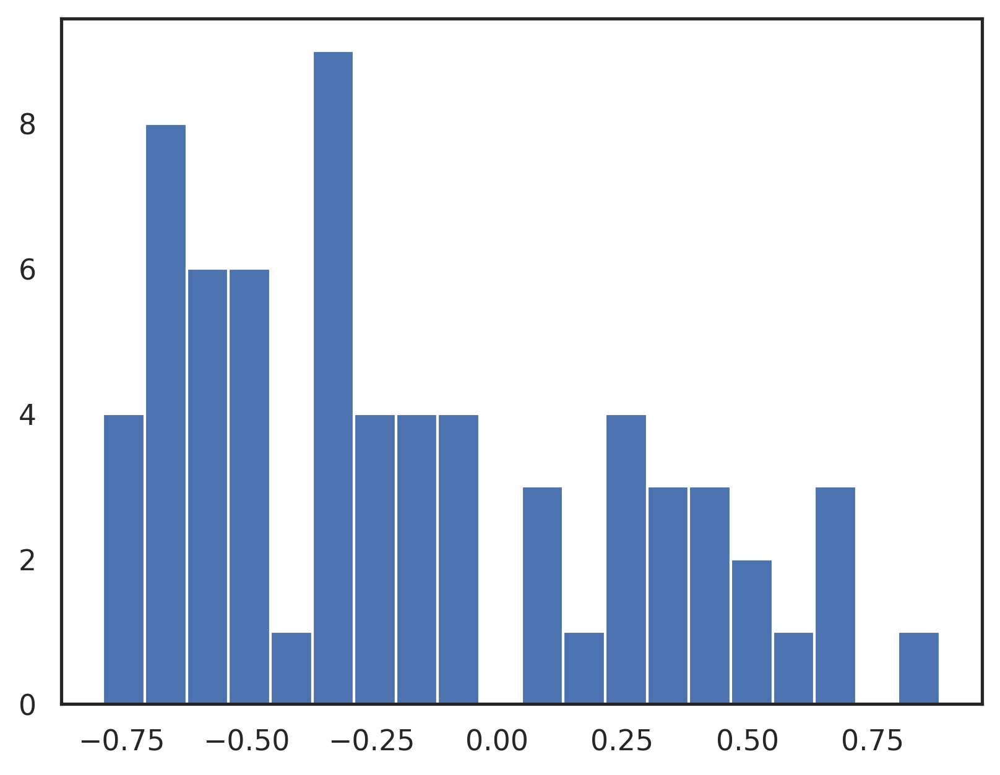

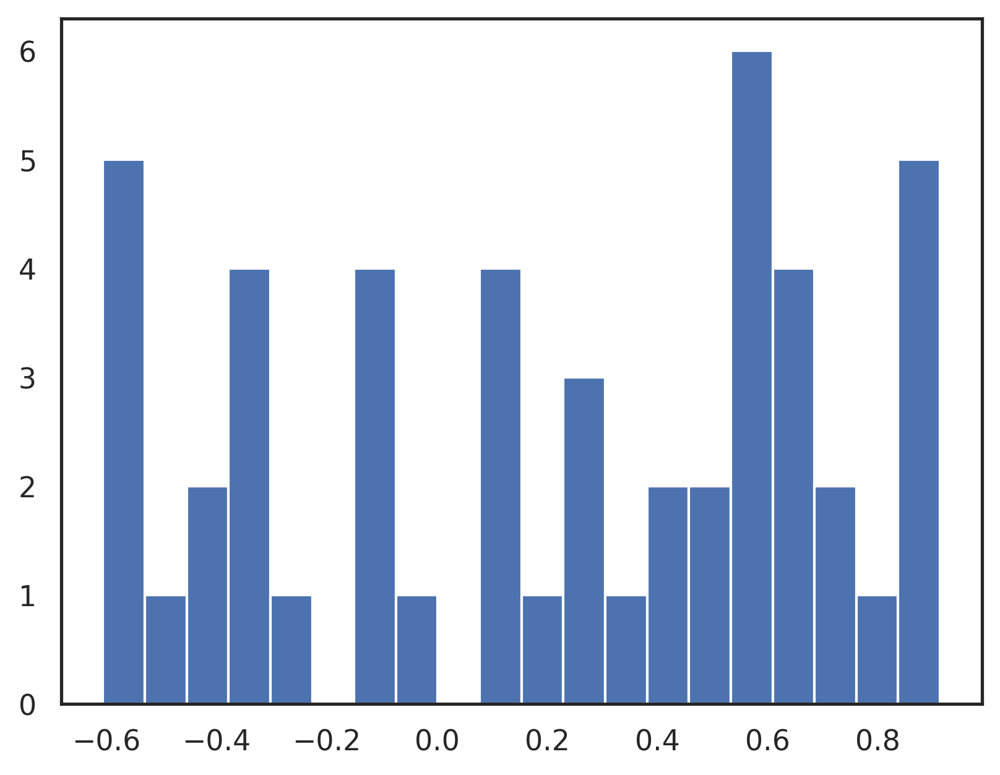

Mean NPMI (off-diagonal): -0.1767643278437914
Mean NPMI (diagonal): 0.2004310840134115


In [7]:
import matplotlib.pyplot as plt
import differentiation_map_validation as dmv
importlib.reload(dmv)

T13 = Ts_ann[0] @ np.diag( 1/ np.sum(Qs_ann[1], axis=0) ) @ Ts_ann[1]
g1 = proportions[0]
g3 = proportions[2]

edge_dir = "/scratch/gpfs/ph3641/hm_ot/edges.txt"
node_dir = "/scratch/gpfs/ph3641/hm_ot/nodes.txt"
# Load the data
nodes_df = pd.read_csv(node_dir, sep="\t")
edges_df = pd.read_csv(edge_dir, sep="\t")


G, labels_G = dmv.yield_differentiation_graph(nodes_df, edges_df, plotting=False)

edge_scores, diagonal_edge_scores = dmv.score_from_graph([Qs_ann[0], Qs_ann[2]], [T13], [labels[0], labels[2]], ['E8.5', 'E9.0'],
                             G, labels_G, edges_df, 
                            )

npmis = []
npmis_all = []
diagonal_npmis = []

for key in edge_scores:
    # Assume at least one timepoint has transition, so apply max
    npmi_max = np.max(edge_scores[key])
    npmis.append(npmi_max)
    npmis_all.extend(edge_scores[key])


for key in diagonal_edge_scores:
    diagonal_npmi_mean = np.mean(diagonal_edge_scores[key])
    diagonal_npmis.append(diagonal_npmi_mean)


plt.hist(npmis, bins=20)
plt.show()

plt.hist(diagonal_npmis, bins=20)
plt.show()

print(f'Mean NPMI (off-diagonal): {np.mean(npmis)}')
print(f'Mean NPMI (diagonal): {np.mean(diagonal_npmis)}')



Iteration: 0
Initial Wasserstein cost: 1.849695743794122e-11, GW-cost: 0, Total cost: 1.849695743794122e-11
Final Wasserstein cost: 1.7114955286334776e-11, GW-cost: 0, Total cost: 1.7114955286334776e-11


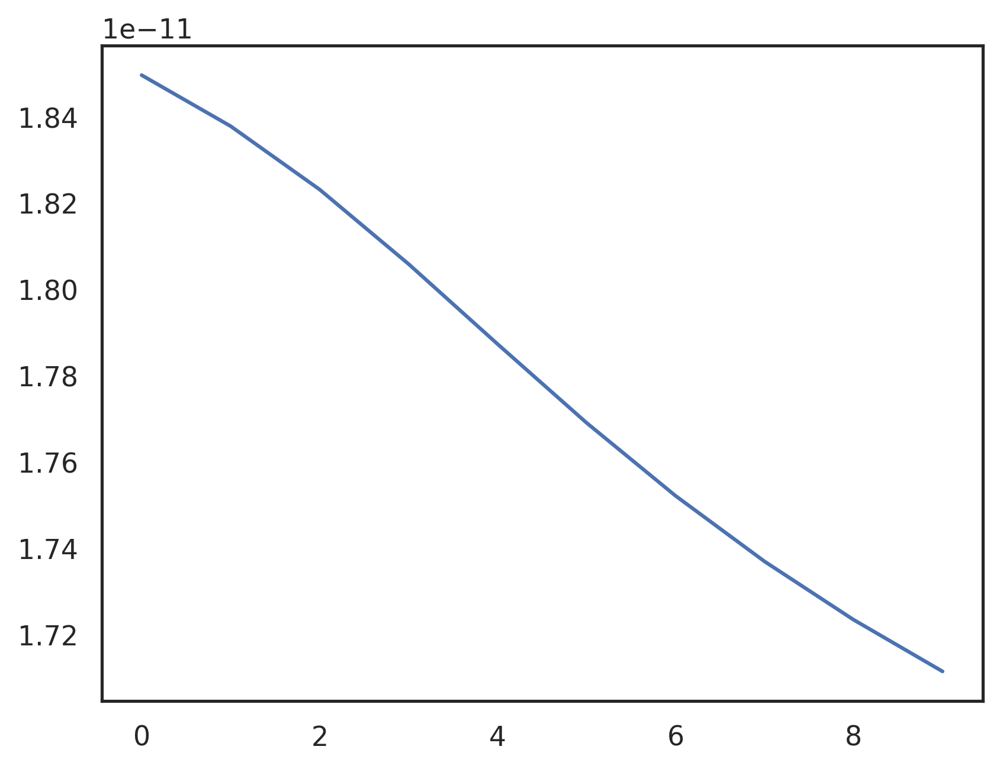

Iteration: 0
Initial Wasserstein cost: 2.7054780291080327e-11, GW-cost: 0, Total cost: 2.7054780291080327e-11
Final Wasserstein cost: 2.4090677369636992e-11, GW-cost: 0, Total cost: 2.4090677369636992e-11


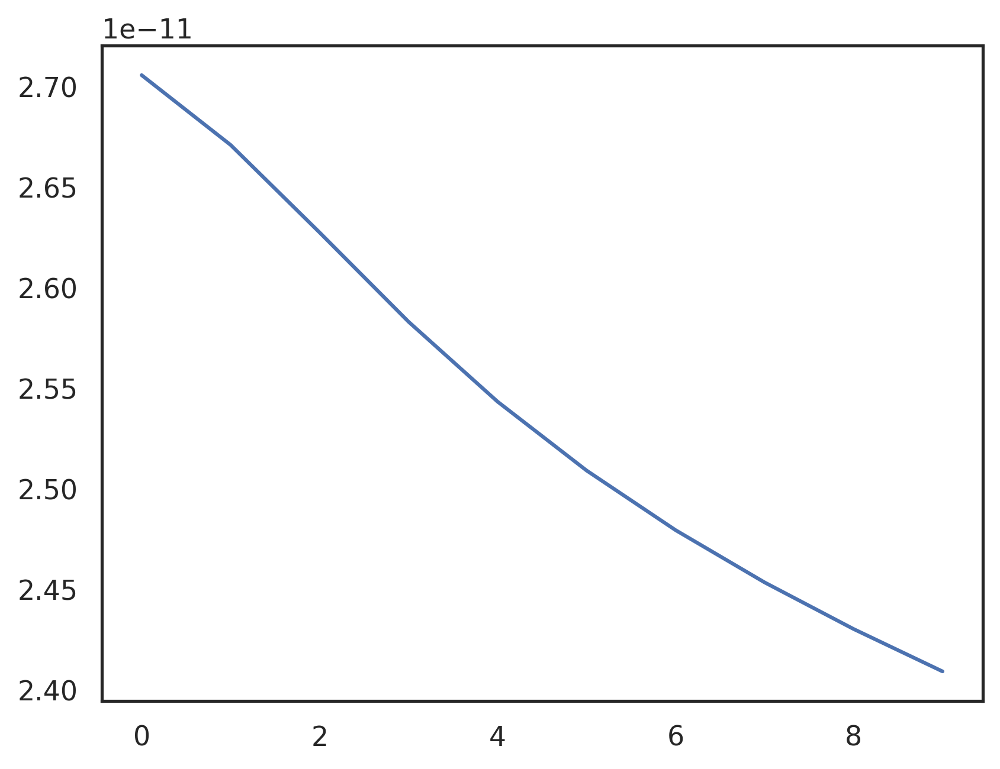

In [14]:
hmot_init = HiddenMarkovOT.HM_OT(
                                rank_list, 
                                tau_in = 1000, 
                                tau_out = 1000,
                                gamma=2,
                                max_iter=10,
                                min_iter=10,
                                device=device,
                                dtype=torch.float32,
                                 printCost=True,
                                returnFull=False,
                                alpha=0.0,
                                initialization='Full'
                               )
hmot_init.impute_annotated_transitions(C_factors_sequence, 
                                       A_factors_sequence, 
                                       Qs
                                        )

/tmp/ipykernel_3178399/2747561173.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  init_args=(torch.tensor(Qs[0]).to(torch.float32),
/tmp/ipykernel_3178399/2747561173.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(Qs[-1]).to(torch.float32)),


Ranks: r1 54, r2 58, r3 65
Iteration: 0
Initial Wasserstein-sum cost: 4.049685239926326e-11
Final Wasserstein-sum cost: 3.758618416505044e-11


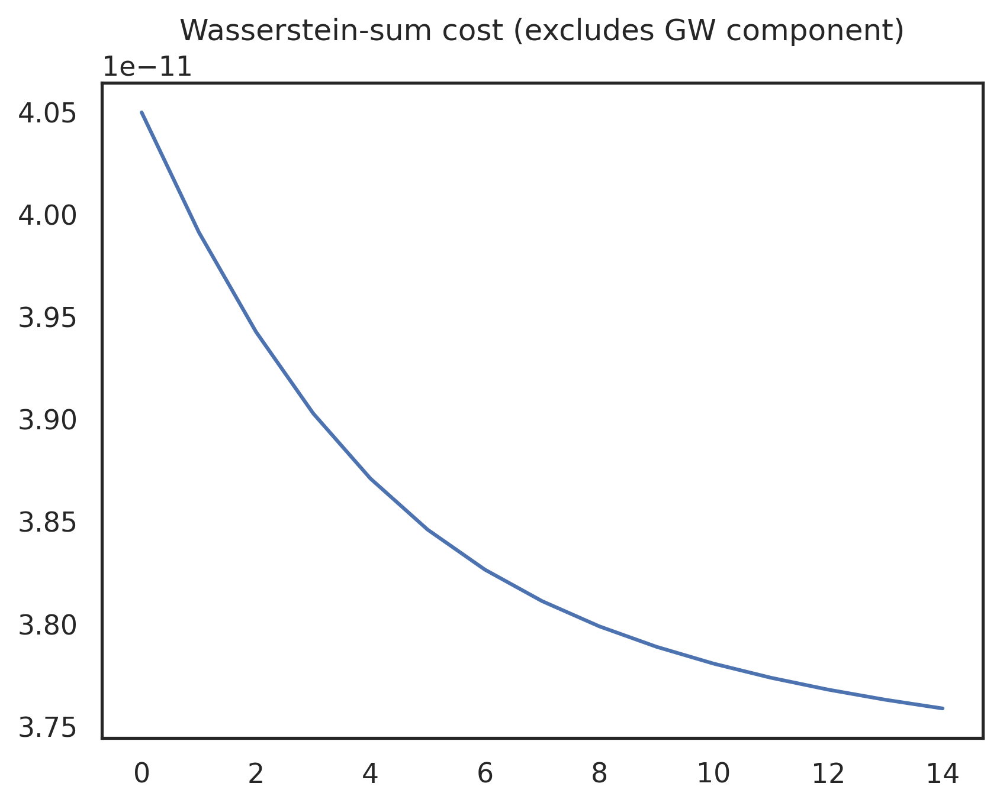

Mapping Amniotic ectoderm to self at times E8.5 to E9.0
Mapping Anterior floor plate to self at times E8.5 to E9.0
Mapping Anterior intermediate mesoderm to self at times E8.5 to E9.0
Mapping Anterior roof plate to self at times E8.5 to E9.0
Mapping Arterial endothelial cells to self at times E8.5 to E9.0
Mapping Cranial motor neurons to self at times E8.5 to E9.0
Mapping Definitive early erythroblasts (CD36-) to self at times E8.5 to E9.0
Mapping Dermomyotome to self at times E8.5 to E9.0
Mapping Diencephalon to self at times E8.5 to E9.0
Mapping Dorsal telencephalon to self at times E8.5 to E9.0
Mapping Endocardial cells to self at times E8.5 to E9.0
Mapping Endothelium to self at times E8.5 to E9.0
Mapping Enteric neurons to self at times E8.5 to E9.0
Mapping Extraembryonic visceral endoderm to self at times E8.5 to E9.0
Mapping Eye field to self at times E8.5 to E9.0
Mapping Facial mesenchyme to self at times E8.5 to E9.0
Mapping First heart field to self at times E8.5 to E9.0
Mapp

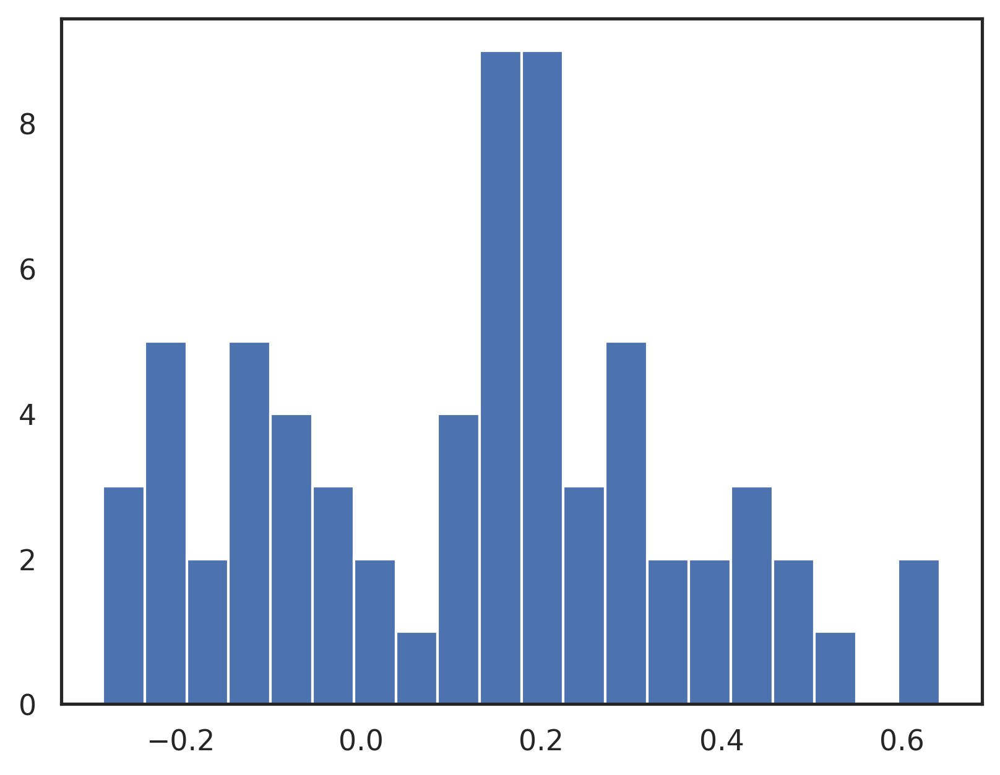

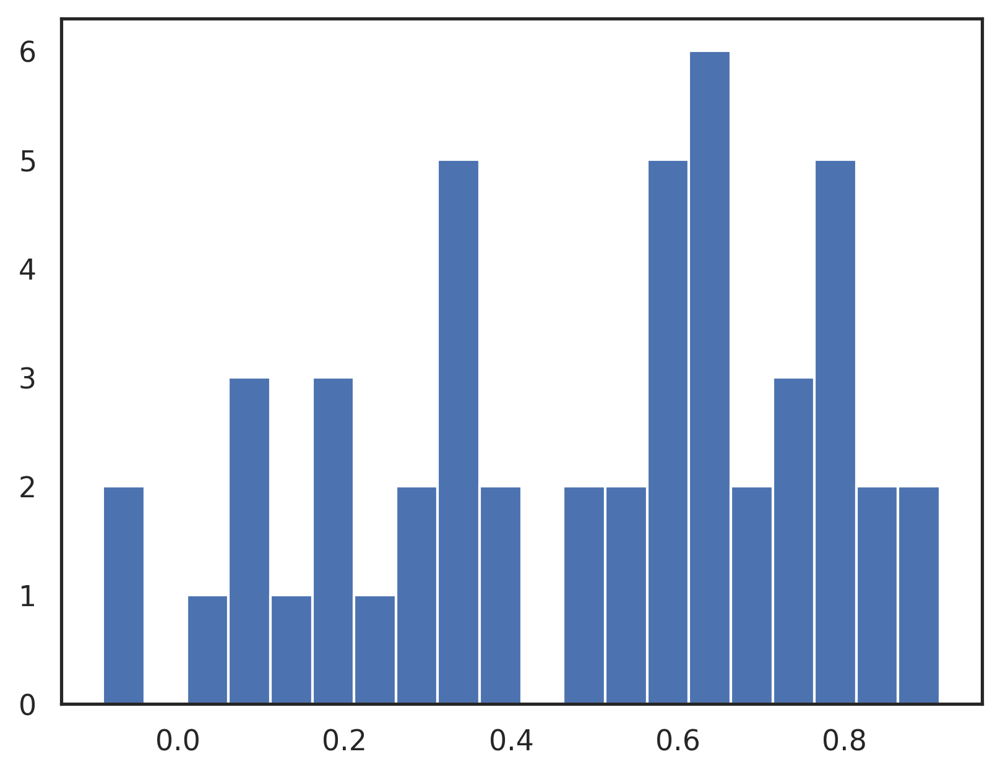

Median NPMI (off-diagonal): 0.16147448122501373
Median NPMI (diagonal): 0.5654767751693726
Mean NPMI (off-diagonal): 0.12307979791999268
Mean NPMI (diagonal): 0.4887451231479645


In [19]:
importlib.reload(FRLC.FRLC_multimarginal)
from FRLC.FRLC_multimarginal import FRLC_LR_opt_multimarginal


_Q_t = hmot_init.Q_gammas[1]
_T_tm1t, _T_ttp1 = hmot_init.T_gammas

Q_t, T_tm1t, T_ttp1 = FRLC_LR_opt_multimarginal(C_factors_sequence[0],
                                                A_factors_sequence[0],
                                                A_factors_sequence[1],
                                                C_factors_sequence[1],
                                                A_factors_sequence[1],
                                                A_factors_sequence[2],
                                                r=rank2,
                                                max_iter = 15,
                                                device=device,
                                                alpha=0,
                                                min_iter = 15,
                                                initialization='Full',
                                                tau_in=1000,
                                                gamma=5,
                                                init_args=(torch.tensor(Qs[0]).to(torch.float32),
                                                           torch.tensor(Qs[-1]).to(torch.float32)),
                                                printCost=True,
                                                dtype=torch.float32,
                                                _Q_t = _Q_t,
                                                _T_tm1t = _T_tm1t,
                                                _T_ttp1 = _T_ttp1)
'''
hmot = HiddenMarkovOT.HM_OT(rank_list, 
                            tau_in = 1000, 
                            tau_out = 1000,
                            gamma=5,
                            max_iter=20,
                            min_iter=20,
                            device=device,
                            dtype=torch.float32,
                             printCost=True,
                            returnFull=False,
                            alpha=0.0,
                            initialization='Full',
                            proportions = proportions
                           ) # Full

hmot.gamma_smoothing(C_factors_sequence,
                     A_factors_sequence,
                    Q_IC = torch.tensor(Qs[0]).to(torch.float32),
                    R_TC = torch.tensor(Qs[-1]).to(torch.float32))
Ts_ann = [T.cpu().numpy() for T in hmot.T_gammas]
Qs_ann = [Q.cpu().numpy() for Q in hmot.Q_gammas]
'''

Q_t, T_tm1t, T_ttp1 = Q_t.cpu().numpy(), T_tm1t.cpu().numpy(), T_ttp1.cpu().numpy()
#T13 = Ts_ann[0] @ np.diag( 1/ np.sum(Qs_ann[1], axis=0) ) @ Ts_ann[1]
T13 = T_tm1t @ np.diag( 1/ np.sum(Q_t, axis=0) ) @ T_ttp1
g1 = proportions[0]
g3 = proportions[2]

edge_scores, diagonal_edge_scores = dmv.score_from_graph(
                                                        [Qs_ann[0], Qs_ann[2]], 
                                                         [T13], [labels[0], labels[2]], ['E8.5', 'E9.0'],
                                                         G, labels_G, edges_df, 
                                                        )
npmis = []
npmis_all = []
diagonal_npmis = []

for key in edge_scores:
    # Assume at least one timepoint has transition, so apply max
    npmi_max = np.max(edge_scores[key])
    npmis.append(npmi_max)
    npmis_all.extend(edge_scores[key])

for key in diagonal_edge_scores:
    diagonal_npmi_mean = np.mean(diagonal_edge_scores[key])
    diagonal_npmis.append(diagonal_npmi_mean)

plt.hist(npmis, bins=20)
plt.show()

plt.hist(diagonal_npmis, bins=20)
plt.show()




print(f'Median NPMI (off-diagonal): {np.median(npmis)}')
print(f'Median NPMI (diagonal): {np.median(diagonal_npmis)}')
print(f'Mean NPMI (off-diagonal): {np.mean(npmis)}')
print(f'Mean NPMI (diagonal): {np.mean(diagonal_npmis)}')


In [20]:
with open('edge_scores_hmot_sup.pkl', 'wb') as f:
    pickle.dump(edge_scores, f)

with open('diagonal_edge_scores_hmot_sup.pkl', 'wb') as f:
    pickle.dump(diagonal_edge_scores, f)


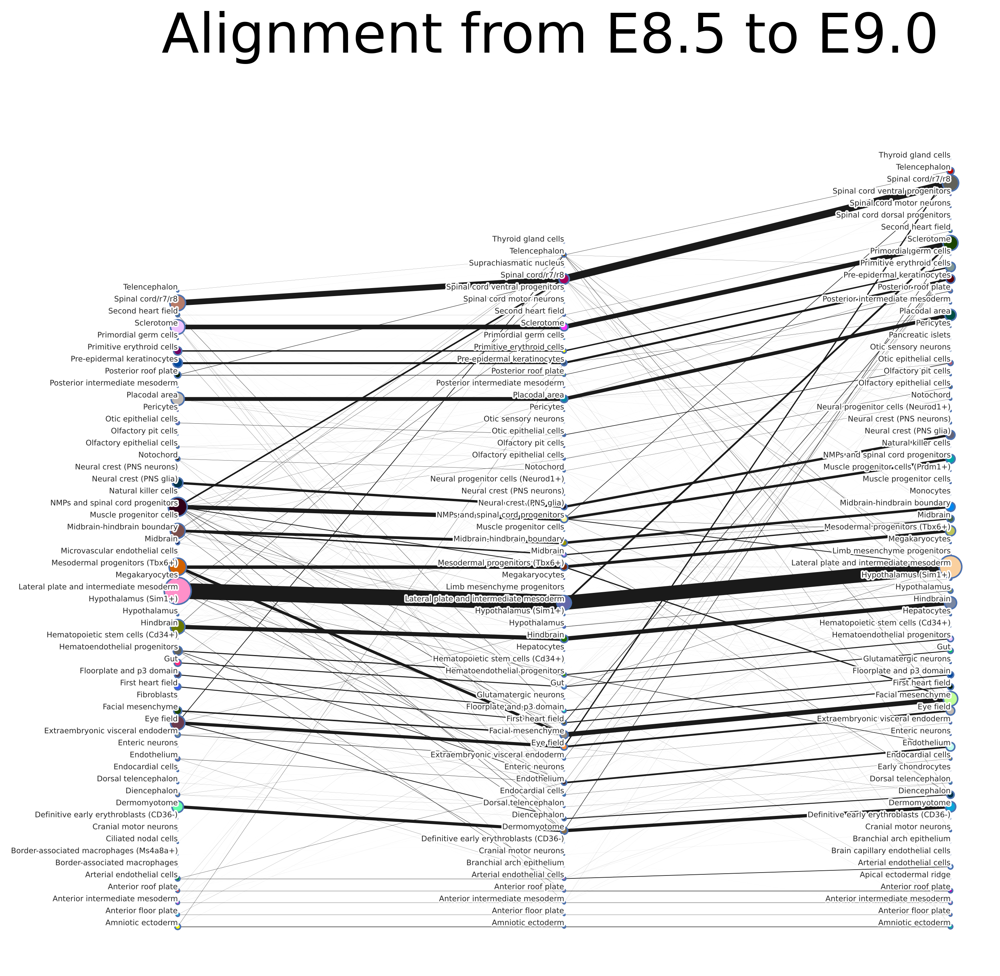

In [25]:


plotting.diffmap_from_QT([ Qs_ann[0], Q_t, Qs_ann[2] ],
                         [T_tm1t, T_ttp1],
                         [labels[0], labels[1], labels[2]],
                         dsf=0.01,
                        fontsize=5,
                        linethick_factor=55,
                        title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
                        save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all.png") )





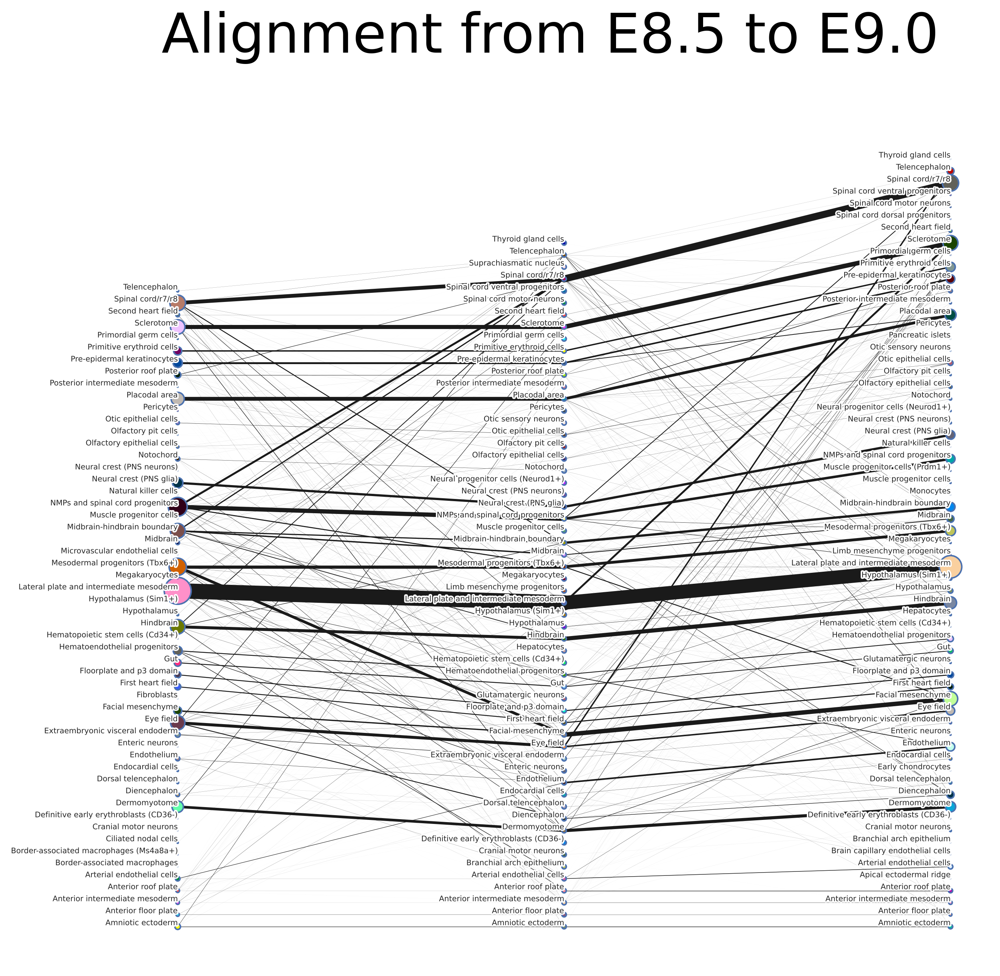

In [27]:
Q_ann = [Q.cpu().numpy() for Q in hmot_init.Q_gammas]
T_sup = [T.cpu().numpy() for T in hmot_init.T_gammas]

plotting.diffmap_from_QT(Qs_ann,
                         T_sup,
                         [labels[0], labels[1], labels[2]],
                         dsf=0.01,
                        fontsize=5,
                        linethick_factor=55,
                        title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
                        save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all.png")
                        )

In [20]:
import clustering
import scanpy as sc

clusterings_hmot = clustering.max_likelihood_clustering(Qs_ann, mode='standard')

keys = ["t1", "t2", "t3"]
cluster_labels = []

for key, labs in zip(keys, clusterings_hmot):
    cluster_labels.extend([f"{key}_{label}" for label in labs])

# Assign to .obs in combined AnnData
subset_adata.obs['hmot_cluster_time'] = cluster_labels

#adata_combined.obs['hmot_cluster'] = all_clusters.astype(str)
adata_sub = sc.pp.subsample(subset_adata, n_obs=30_000, random_state=42, copy=True)
#adata_sub = adata_combined
#sc.tl.pca(adata_sub)
sc.pp.neighbors(adata_sub, use_rep='X_pca')
sc.tl.umap(adata_sub)
sc.pl.umap(adata_sub, color='hmot_cluster_time')

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

loading E8.5 to E8.75
loading E8.75 to E9.0


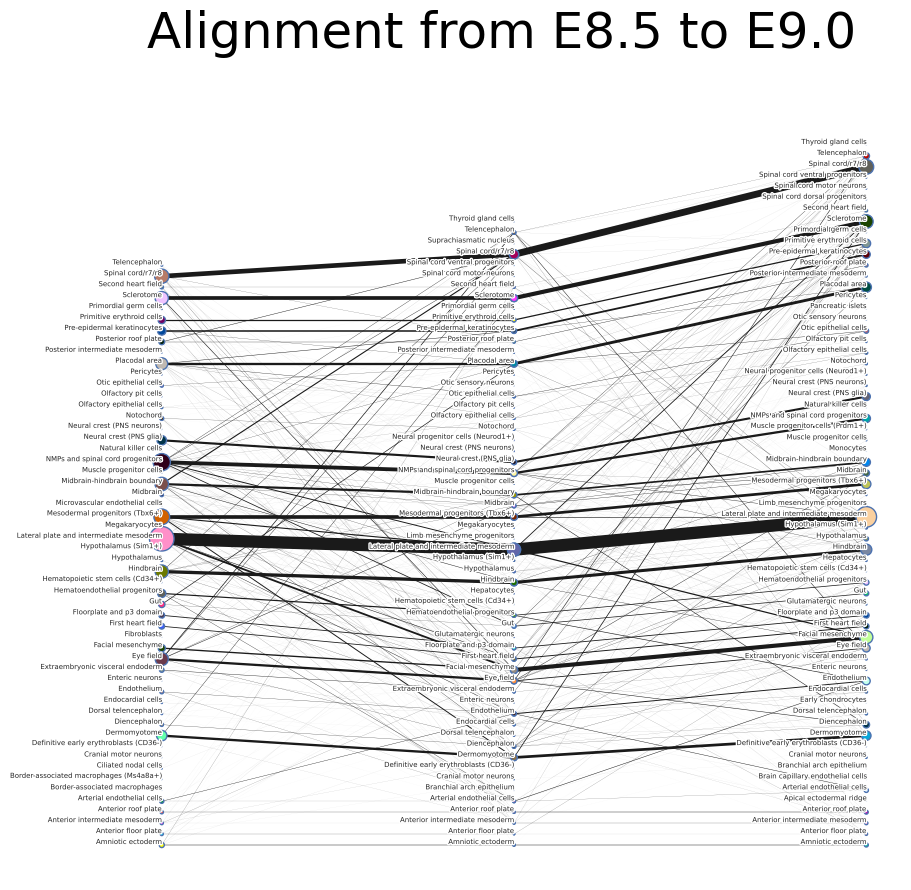

In [11]:
import os
import numpy as np
import pickle
import importlib
importlib.reload(plotting)

diffmap_dir = "/scratch/gpfs/ph3641/hm_ot/ME_supervised_diffmap_allrep/"
'''
timepoints = ['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5', 'E9.75', 'E10.0', 'E10.25', 'E10.5', 'E10.75',
              'E11.0', 'E11.25', 'E11.5', 'E11.75', 'E12.0', 'E12.25', 'E12.5', 'E12.75',
             'E13.0', 'E13.25', 'E13.5', 'E13.75', 'E14.0']
'''
timepoints =  ['E8.5', 'E8.75', 'E9.0'] #, 'E9.25', 'E9.5', 'E9.75', 'E10.0']

_Qs = []
_Ts = []
_labels = []

for i in range(len(timepoints) - 1):
    
    t1 = timepoints[i]
    t2 = timepoints[i + 1]

    print(f'loading {t1} to {t2}')
    
    # Load Q and T matrices
    Q1 = np.load(os.path.join(diffmap_dir, f"{t1}_Q.npy"))
    Q2 = np.load(os.path.join(diffmap_dir, f"{t2}_Q.npy"))
    T12 = np.load(os.path.join(diffmap_dir, f"{t1}_{t2}_T.npy"))
    
    if i == 0:
        _Qs.append(Q1)
    _Qs.append(Q2)
    _Ts.append(T12)
    
    # Load labels
    with open(os.path.join(diffmap_dir, f"{t1}_types.pkl"), 'rb') as f:
        Label_t1 = pickle.load(f)
    with open(os.path.join(diffmap_dir, f"{t2}_types.pkl"), 'rb') as f:
        Label_t2 = pickle.load(f)
    
    if i == 0:
        _labels.append(Label_t1)
    _labels.append(Label_t2)

# Plot the full alignment
plotting.diffmap_from_QT(
    _Qs, _Ts, _labels,
    dsf=0.01,
    fontsize=5,
    linethick_factor=55,
    title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
    save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all.png")
)

In [12]:
for Q in _Qs:
    print(Q.shape)

for T in _Ts:
    print(T.shape)

for lab in _labels:
    print(len(lab))


(153597, 54)
(46253, 58)
(118049, 65)
(54, 58)
(58, 65)
54
58
65
